Import Dependencies

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
import missingno as msno
import seaborn as sns

Read Dataset

In [2]:
df = pd.read_csv('CarPrice_Assignment.csv')
pd.set_option('display.max_columns', None)
df

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,201,-1,volvo 145e (sw),gas,std,four,sedan,rwd,front,109.1,188.8,68.9,55.5,2952,ohc,four,141,mpfi,3.78,3.15,9.5,114,5400,23,28,16845.0
201,202,-1,volvo 144ea,gas,turbo,four,sedan,rwd,front,109.1,188.8,68.8,55.5,3049,ohc,four,141,mpfi,3.78,3.15,8.7,160,5300,19,25,19045.0
202,203,-1,volvo 244dl,gas,std,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3012,ohcv,six,173,mpfi,3.58,2.87,8.8,134,5500,18,23,21485.0
203,204,-1,volvo 246,diesel,turbo,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3217,ohc,six,145,idi,3.01,3.40,23.0,106,4800,26,27,22470.0


Overview of the Dataset

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   car_ID            205 non-null    int64  
 1   symboling         205 non-null    int64  
 2   CarName           205 non-null    object 
 3   fueltype          205 non-null    object 
 4   aspiration        205 non-null    object 
 5   doornumber        205 non-null    object 
 6   carbody           205 non-null    object 
 7   drivewheel        205 non-null    object 
 8   enginelocation    205 non-null    object 
 9   wheelbase         205 non-null    float64
 10  carlength         205 non-null    float64
 11  carwidth          205 non-null    float64
 12  carheight         205 non-null    float64
 13  curbweight        205 non-null    int64  
 14  enginetype        205 non-null    object 
 15  cylindernumber    205 non-null    object 
 16  enginesize        205 non-null    int64  
 1

Summary statistics of the Dataset

In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
car_ID,205.0,103.000000,59.322565,1.00,52.00,103.00,154.00,205.00
symboling,205.0,0.834146,1.245307,-2.00,0.00,1.00,2.00,3.00
wheelbase,205.0,98.756585,6.021776,86.60,94.50,97.00,102.40,120.90
carlength,205.0,174.049268,12.337289,141.10,166.30,173.20,183.10,208.10
carwidth,205.0,65.907805,2.145204,60.30,64.10,65.50,66.90,72.30
carheight,205.0,53.724878,2.443522,47.80,52.00,54.10,55.50,59.80
curbweight,205.0,2555.565854,520.680204,1488.00,2145.00,2414.00,2935.00,4066.00
enginesize,205.0,126.907317,41.642693,61.00,97.00,120.00,141.00,326.00
boreratio,205.0,3.329756,0.270844,2.54,3.15,3.31,3.58,3.94
stroke,205.0,3.255415,0.313597,2.07,3.11,3.29,3.41,4.17


Find Missing Values

In [5]:
missing_percent = df.isnull().sum() * 100 / len(df)
missing_count = df.isnull().sum()
missing_value = pd.DataFrame({'count_missing': missing_count,
                              'percent_missing': missing_percent})
missing_value.sort_values('percent_missing', inplace=True)
missing_value

,count_missing,percent_missing
car_ID,0,0.0
citympg,0,0.0
peakrpm,0,0.0
horsepower,0,0.0
compressionratio,0,0.0
stroke,0,0.0
boreratio,0,0.0
fuelsystem,0,0.0
enginesize,0,0.0
cylindernumber,0,0.0


<AxesSubplot:>

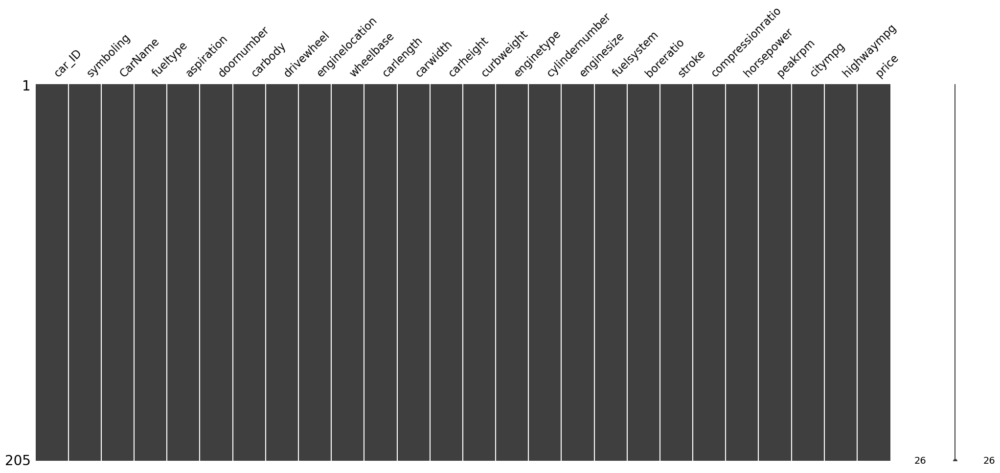

In [6]:
msno.matrix(df)

Dropping Columns

In [7]:
df1 = df.drop(columns = ['CarName','car_ID'])
df1

,symboling,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,3,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,3,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,1,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,2,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,2,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,-1,gas,std,four,sedan,rwd,front,109.1,188.8,68.9,55.5,2952,ohc,four,141,mpfi,3.78,3.15,9.5,114,5400,23,28,16845.0
201,-1,gas,turbo,four,sedan,rwd,front,109.1,188.8,68.8,55.5,3049,ohc,four,141,mpfi,3.78,3.15,8.7,160,5300,19,25,19045.0
202,-1,gas,std,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3012,ohcv,six,173,mpfi,3.58,2.87,8.8,134,5500,18,23,21485.0
203,-1,diesel,turbo,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3217,ohc,six,145,idi,3.01,3.40,23.0,106,4800,26,27,22470.0


Converting Categorical values to Numerical

In [8]:
print(df1['fueltype'].value_counts())
print(df1['aspiration'].value_counts())
print(df1['doornumber'].value_counts())
print(df1['carbody'].value_counts())
print(df1['drivewheel'].value_counts())
print(df1['enginelocation'].value_counts())
print(df1['enginetype'].value_counts())
print(df1['cylindernumber'].value_counts())
print(df1['fuelsystem'].value_counts())

gas       185
diesel     20
Name: fueltype, dtype: int64
std      168
turbo     37
Name: aspiration, dtype: int64
four    115
two      90
Name: doornumber, dtype: int64
sedan          96
hatchback      70
wagon          25
hardtop         8
convertible     6
Name: carbody, dtype: int64
fwd    120
rwd     76
4wd      9
Name: drivewheel, dtype: int64
front    202
rear       3
Name: enginelocation, dtype: int64
ohc      148
ohcf      15
ohcv      13
dohc      12
l         12
rotor      4
dohcv      1
Name: enginetype, dtype: int64
four      159
six        24
five       11
eight       5
two         4
three       1
twelve      1
Name: cylindernumber, dtype: int64
mpfi    94
2bbl    66
idi     20
1bbl    11
spdi     9
4bbl     3
mfi      1
spfi     1
Name: fuelsystem, dtype: int64


In [9]:
df1['fueltype'].replace(['gas','diesel'],
                       [0,1], inplace = True)
df1.head()

,symboling,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,3,0,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,3,0,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,1,0,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,2,0,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,2,0,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


In [10]:
df1['aspiration'].replace(['std','turbo'],
                       [0,1], inplace = True)
df1.head()

,symboling,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,3,0,0,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,3,0,0,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,1,0,0,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,2,0,0,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,2,0,0,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


In [11]:
df1['doornumber'].replace(['two','four'],
                       [2,4], inplace = True)
df1.head()

,symboling,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,3,0,0,2,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,3,0,0,2,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,1,0,0,2,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,2,0,0,4,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,2,0,0,4,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


In [12]:
df1['carbody'].replace(['sedan','hatchback','wagon','hardtop','convertible'],
                      [0,1,2,3,4], inplace = True)
df1.head()

,symboling,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,3,0,0,2,4,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,3,0,0,2,4,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,1,0,0,2,1,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,2,0,0,4,0,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,2,0,0,4,0,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


In [13]:
df1['drivewheel'].replace(['fwd','rwd','4wd'],
                       [0,1,2], inplace = True)
df1.head()

,symboling,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,3,0,0,2,4,1,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,3,0,0,2,4,1,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,1,0,0,2,1,1,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,2,0,0,4,0,0,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,2,0,0,4,0,2,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


In [14]:
df1['enginelocation'].replace(['front','rear'],
                       [0,1], inplace = True)
df1.head()

,symboling,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,3,0,0,2,4,1,0,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,3,0,0,2,4,1,0,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,1,0,0,2,1,1,0,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,2,0,0,4,0,0,0,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,2,0,0,4,0,2,0,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


In [15]:
df1['enginetype'].replace(['ohc','ohcf','ohcv','dohc','dohcv','l','rotor'],
                         [0,1,2,3,4,5,6], inplace = True)
df1.head()

,symboling,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,3,0,0,2,4,1,0,88.6,168.8,64.1,48.8,2548,3,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,3,0,0,2,4,1,0,88.6,168.8,64.1,48.8,2548,3,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,1,0,0,2,1,1,0,94.5,171.2,65.5,52.4,2823,2,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,2,0,0,4,0,0,0,99.8,176.6,66.2,54.3,2337,0,four,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,2,0,0,4,0,2,0,99.4,176.6,66.4,54.3,2824,0,five,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


In [16]:
df1['cylindernumber'].replace(['two','three','four','five','six','eight','twelve'],
                         [2,3,4,5,6,8,12], inplace = True)
df1.head()

,symboling,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,3,0,0,2,4,1,0,88.6,168.8,64.1,48.8,2548,3,4,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,3,0,0,2,4,1,0,88.6,168.8,64.1,48.8,2548,3,4,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,1,0,0,2,1,1,0,94.5,171.2,65.5,52.4,2823,2,6,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,2,0,0,4,0,0,0,99.8,176.6,66.2,54.3,2337,0,4,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,2,0,0,4,0,2,0,99.4,176.6,66.4,54.3,2824,0,5,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


In [17]:
df1['fuelsystem'].replace(['mpfi','2bbl','idi','1bbl','spdi','4bbl','mfi','spfi'],
                         [0,1,2,3,4,5,6,7], inplace = True)
df1.head()

,symboling,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,3,0,0,2,4,1,0,88.6,168.8,64.1,48.8,2548,3,4,130,0,3.47,2.68,9.0,111,5000,21,27,13495.0
1,3,0,0,2,4,1,0,88.6,168.8,64.1,48.8,2548,3,4,130,0,3.47,2.68,9.0,111,5000,21,27,16500.0
2,1,0,0,2,1,1,0,94.5,171.2,65.5,52.4,2823,2,6,152,0,2.68,3.47,9.0,154,5000,19,26,16500.0
3,2,0,0,4,0,0,0,99.8,176.6,66.2,54.3,2337,0,4,109,0,3.19,3.40,10.0,102,5500,24,30,13950.0
4,2,0,0,4,0,2,0,99.4,176.6,66.4,54.3,2824,0,5,136,0,3.19,3.40,8.0,115,5500,18,22,17450.0


Dataset Correlation

<AxesSubplot:>

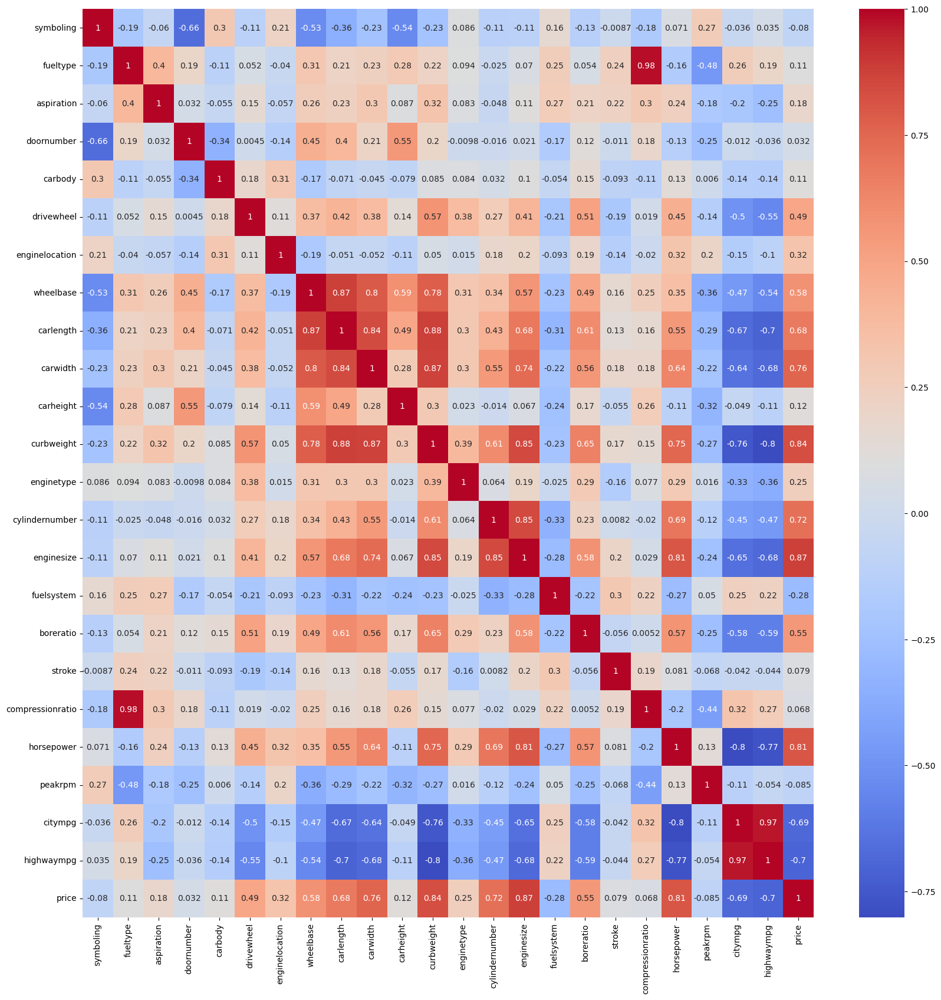

In [18]:
df1.corr()
plt.figure(figsize=(20,20))
sns.heatmap(df1.corr(), annot=True, cmap = "coolwarm")

Dataset Splitting

In [19]:
y = df1['price']
y

0      13495.0
1      16500.0
2      16500.0
3      13950.0
4      17450.0
        ...   
200    16845.0
201    19045.0
202    21485.0
203    22470.0
204    22625.0
Name: price, Length: 205, dtype: float64

In [20]:
x = df1.drop('price', axis = 1)
x

,symboling,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg
0,3,0,0,2,4,1,0,88.6,168.8,64.1,48.8,2548,3,4,130,0,3.47,2.68,9.0,111,5000,21,27
1,3,0,0,2,4,1,0,88.6,168.8,64.1,48.8,2548,3,4,130,0,3.47,2.68,9.0,111,5000,21,27
2,1,0,0,2,1,1,0,94.5,171.2,65.5,52.4,2823,2,6,152,0,2.68,3.47,9.0,154,5000,19,26
3,2,0,0,4,0,0,0,99.8,176.6,66.2,54.3,2337,0,4,109,0,3.19,3.40,10.0,102,5500,24,30
4,2,0,0,4,0,2,0,99.4,176.6,66.4,54.3,2824,0,5,136,0,3.19,3.40,8.0,115,5500,18,22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,-1,0,0,4,0,1,0,109.1,188.8,68.9,55.5,2952,0,4,141,0,3.78,3.15,9.5,114,5400,23,28
201,-1,0,1,4,0,1,0,109.1,188.8,68.8,55.5,3049,0,4,141,0,3.78,3.15,8.7,160,5300,19,25
202,-1,0,0,4,0,1,0,109.1,188.8,68.9,55.5,3012,2,6,173,0,3.58,2.87,8.8,134,5500,18,23
203,-1,1,1,4,0,1,0,109.1,188.8,68.9,55.5,3217,0,6,145,2,3.01,3.40,23.0,106,4800,26,27


In [21]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=100)

In [22]:
x_train

,symboling,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg
3,2,0,0,4,0,0,0,99.8,176.6,66.2,54.3,2337,0,4,109,0,3.19,3.40,10.0,102,5500,24,30
157,0,0,0,4,1,0,0,95.7,166.3,64.4,52.8,2109,0,4,98,1,3.19,3.03,9.0,70,4800,30,37
81,3,0,0,2,1,0,0,96.3,173.0,65.4,49.4,2328,0,4,122,1,3.35,3.46,8.5,88,5000,25,32
32,1,0,0,2,1,0,0,93.7,150.0,64.0,52.6,1837,0,4,79,3,2.91,3.07,10.1,60,5500,38,42
99,0,0,0,4,1,0,0,97.2,173.4,65.2,54.7,2324,0,4,120,1,3.33,3.47,8.5,97,5200,27,34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87,1,0,1,4,0,0,0,96.3,172.4,65.4,51.6,2403,0,4,110,4,3.17,3.46,7.5,116,5500,23,30
103,0,0,0,4,0,0,0,100.4,184.6,66.5,55.1,3060,2,6,181,0,3.43,3.27,9.0,152,5200,19,25
67,-1,1,1,4,0,1,0,110.0,190.9,70.3,56.5,3515,0,5,183,2,3.58,3.64,21.5,123,4350,22,25
24,1,0,0,4,1,0,0,93.7,157.3,63.8,50.6,1967,0,4,90,1,2.97,3.23,9.4,68,5500,31,38


In [23]:
x_test

,symboling,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg
160,0,0,0,4,0,0,0,95.7,166.3,64.4,53.0,2094,0,4,98,1,3.19,3.03,9.0,70,4800,38,47
186,2,0,0,4,0,0,0,97.3,171.7,65.5,55.7,2275,0,4,109,0,3.19,3.40,9.0,85,5250,27,34
59,1,0,0,2,1,0,0,98.8,177.8,66.5,53.7,2385,0,4,122,1,3.39,3.39,8.6,84,4800,26,32
165,1,0,0,2,0,1,0,94.5,168.7,64.0,52.6,2265,3,4,98,0,3.24,3.08,9.4,112,6600,26,29
140,2,0,0,2,1,2,0,93.3,157.3,63.8,55.7,2240,1,4,108,1,3.62,2.64,8.7,73,4400,26,31
64,0,0,0,4,1,0,0,98.8,177.8,66.5,55.5,2425,0,4,122,1,3.39,3.39,8.6,84,4800,26,32
198,-2,0,1,4,0,1,0,104.3,188.8,67.2,56.2,3045,0,4,130,0,3.62,3.15,7.5,162,5100,17,22
75,1,0,1,2,1,1,0,102.7,178.4,68.0,54.8,2910,0,4,140,0,3.78,3.12,8.0,175,5000,19,24
172,2,0,0,2,4,1,0,98.4,176.2,65.6,53.0,2975,0,4,146,0,3.62,3.50,9.3,116,4800,24,30
104,3,0,0,2,1,1,0,91.3,170.7,67.9,49.7,3071,2,6,181,0,3.43,3.27,9.0,160,5200,19,25


In [24]:
y_train

3      13950.0
157     7198.0
81      8499.0
32      5399.0
99      8949.0
        ...   
87      9279.0
103    13499.0
67     25552.0
24      6229.0
8      23875.0
Name: price, Length: 164, dtype: float64

In [25]:
y_test

160     7738.0
186     8495.0
59      8845.0
165     9298.0
140     7603.0
64     11245.0
198    18420.0
75     16503.0
172    17669.0
104    17199.0
200    16845.0
136    18150.0
111    15580.0
41     12945.0
73     40960.0
31      6855.0
156     6938.0
133    12170.0
65     18280.0
83     14869.0
195    13415.0
197    16515.0
126    32528.0
118     5572.0
167     8449.0
101    13499.0
124    12764.0
69     28176.0
11     16925.0
46     11048.0
77      6189.0
15     30760.0
110    13860.0
201    19045.0
115    16630.0
174    10698.0
134    15040.0
169     9989.0
92      6849.0
173     8948.0
74     45400.0
Name: price, dtype: float64

Model Building

In [26]:
lr = LinearRegression()
lr.fit(x_train, y_train)

LinearRegression()

In [27]:
y_train_pred = lr.predict(x_train)
y_test_pred = lr.predict(x_test)

In [28]:
y_train_pred

array([12512.31350931,  6994.03019842,  9885.46523292,  6563.38597738,
        9730.5824834 ,  7069.13382029, 10697.35420296, 10537.7237259 ,
       10189.60408414,  6579.74197862, 14239.4047616 ,  7862.99541379,
       11753.36461445, 19422.12799706,  7838.63544945,  9929.54845112,
       10028.65556811, 15017.4747057 , 10695.58293407,  6468.38722241,
       35410.85498682,  8253.83910479, 21360.32455676,  9639.93864208,
       13431.62506466, 18266.57482871,  8679.26592284,  5545.4687841 ,
       10156.28373674, 16874.45353846,  4480.67044551,  6659.27432694,
       17828.37610143,  9255.30811275,  7194.72551233,  6308.64635245,
        9828.26490629, 35645.14501318,  7158.76382954, 19980.71816965,
       13774.24568582,  6556.24145446, 14619.80527341, 15510.07706486,
       15939.71723751, 27945.59606424, 21289.27888078,  8241.09447077,
        5493.17666057,  6816.15080286,  6886.25273975, 17024.60163027,
        8895.63610706, 11358.5858703 , 10944.27985269,  6566.44126142,
      

In [29]:
y_test_pred

array([ 7628.71450156, 10420.71936427, 10481.56264712,  9898.16995939,
        9756.23563881, 10293.65697441, 18237.37200562, 21175.06889389,
       15154.40934904, 22157.15934905, 20071.8418692 , 15097.02555726,
       21173.51387843,  9836.81129546, 42276.62667366,  7438.66781014,
        7290.59011087, 14072.29738388, 17015.98935143, 15645.06257052,
       17254.26767878, 17147.30741232, 35645.14501318,  6343.86819547,
       14250.04533536, 19480.01468218, 16629.17992137, 25428.78548111,
       12996.7258646 , 12283.67681668,  8055.87633161, 27032.29557062,
       16363.95912459, 22036.58304774, 14389.99605333, 11250.07330553,
       31028.985561  , 14981.97958856,  5457.68405061, 10264.43103538,
       39786.76864037])

In [30]:
lr_train_mse = mean_squared_error(y_train, y_train_pred)*100
lr_train_r2 = r2_score(y_train, y_train_pred)*100
lr_train_mae = mean_absolute_error(y_train, y_train_pred)*100

lr_test_mse = mean_squared_error(y_test, y_test_pred)*100
lr_test_r2 = r2_score(y_test, y_test_pred)*100
lr_test_mae = mean_absolute_error(y_test, y_test_pred)*100

In [31]:
lr_results = pd.DataFrame(['Linear Regression', lr_train_r2, lr_test_r2, lr_train_mse, lr_test_mse, lr_train_mae, lr_test_mae]).transpose()
lr_results.columns = ['Method', 'Training R2', 'Test R2', 'Training MSE', 'Test MSE', 'Training MAE', 'Test MAE']
lr_results

,Method,Training R2,Test R2,Training MSE,Test MSE,Training MAE,Test MAE
0,Linear Regression,88.944806,80.315066,650034945.036344,1516503281.60283,183902.304356,282889.450009


Hyperparameter Tuning

In [32]:
rf_rand = RandomForestRegressor(random_state=100)

param_grid = {
    'n_estimators': [100, 200, 300],  
    'max_features': list(range(1, 10)), 
    'max_depth': [None, 5, 10], 
    'min_samples_split': [2, 5, 10], 
    'min_samples_leaf': [1, 2, 4], 
    'bootstrap': [True, False], 
    'random_state': [100],
    'n_jobs': [-1],
    'verbose': [0, 10, 100]
}

random_search = RandomizedSearchCV(rf_rand, param_distributions=param_grid, n_iter=300, cv=5)
random_search.fit(x_train, y_train)
best_model = random_search.best_estimator_
predictions = best_model.predict(x_test)

mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=16)]: Done 159 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 160 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 162 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 163 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 165 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 166 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 167 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 169 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 172 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 175 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 178 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 181 out of 200 | elapsed:    0.0s remaining:   

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0200s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0197s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0200s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0185s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 156 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 172 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 204 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 273 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 277 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 281 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 285 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 289 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 293 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 297 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0213s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0221s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0242s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0889s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.1s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks     

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0220s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0231s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0239s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batc

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0212s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0210s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0211s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0211s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0225s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batc

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0231s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0226s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batc

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0249s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0225s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 out of 100 |

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0220s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0237s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 out of 100 |

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0212s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0226s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0195s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elap

[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 253 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 254 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 255 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 257 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 259 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 260 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 261 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 262 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 263 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 265 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 266 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 267 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=16)]: Done 214 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 215 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 216 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 217 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 218 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 219 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 220 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 222 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 223 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 224 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 225 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 226 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 227 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 228 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 229 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1662s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0186s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  83 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0209s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 269 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0185s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0035s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0195s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0195s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  54 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0205s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 156 tasks      | elap

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elap

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1790s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0180s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  83 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 113 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 145 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 162 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    2.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:   

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Batch computation too fast (0.0201s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0243s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done  91 out of 100 | elapsed:    0.0s remaining:    0.0s
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0225s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done  91 out of 100 | elapsed:    0.0s remaining:    0.0s
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0045s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | 

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elap

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0040s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0191s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0183s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0196s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0174s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0200s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0190s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 189 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 210 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 233 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 256 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0213s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0210s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 156 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 172 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 251 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 253 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 254 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 255 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 257 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 259 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 260 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 261 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 262 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 263 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 265 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 266 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=16)]: Done  76 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  77 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  78 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  79 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  82 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  83 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  84 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  85 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  86 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  87 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  88 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  89 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  90 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  91 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0200s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 120 tasks      | elap

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elap

[Parallel(n_jobs=16)]: Done 172 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 175 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 178 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 181 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 184 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 187 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 193 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 196 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 200 out of 200 | elapsed:    0.0s finished


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1916s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    2.0s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done  91 out of 100 | elapsed:    2.0s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done  91 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Pa

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0196s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0182s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Batch computation too fast (0.0232s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 215 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0221s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done  91 out of 100 | elapsed:    0.0s remaining:    0.0s
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0221s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Do

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Do

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0225s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Do

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Done  95 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0

[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  16 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 175 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 178 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 181 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 184 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 187 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 193 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 196 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  27 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0205s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elap

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elap

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elap

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1848s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0233s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0192s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 269 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0196s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0045s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0214s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0052s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0225s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0045s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0221s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0045s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0205s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0236s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 out of 100 |

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0206s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0216s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batc

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0230s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0208s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done  91 out of 100 | elapsed:    0.0s remaining:    0.0s
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done  91 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | 

[Parallel(n_jobs=16)]: Done 140 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 141 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 142 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 143 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 145 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 146 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 147 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 150 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 151 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 153 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 154 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 155 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0040s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0195s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 120 tasks      | elap

[Parallel(n_jobs=-1)]: Done 237 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 238 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 239 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 240 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 242 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 243 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 244 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 245 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 246 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 247 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 248 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 249 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 250 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 251 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1788s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0208s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  83 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0226s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 269 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0185s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0035s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0200s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0197s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elap

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 156 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 172 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 237 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 238 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 239 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 240 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 242 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 243 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 244 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 245 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 246 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 247 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 248 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 249 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 250 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 251 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 289 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 293 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 297 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks    

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0040s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0216s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0210s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  52 tasks      | elap

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0228s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  54 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elap

[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0226s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elap

[Parallel(n_jobs=-1)]: Done 172 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 204 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 208 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 212 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 217 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 222 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 226 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 236 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 237 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 238 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 239 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 240 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 242 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 243 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 244 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 245 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 246 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 247 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 248 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 249 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 250 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 251 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 269 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 273 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 277 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 281 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 285 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 289 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 293 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 297 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done

[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  16 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0045s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  76 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  78 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 204 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 208 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 212 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 220 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 225 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 226 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 227 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 229 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 230 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 231 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 259 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 260 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 261 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 262 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 263 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 265 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 266 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 267 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 268 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 269 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 273 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 277 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 281 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 285 out of 300 | elapsed:    0.0s remaining:   

[Parallel(n_jobs=16)]: Done 123 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 125 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 126 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 127 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 129 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 131 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 133 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 134 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 135 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 137 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 138 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1699s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    2.0s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done  91 out of 100 | elapsed:    2.0s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done  91 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Pa

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0211s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  19 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  22 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  23 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  27 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  32 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done  22 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  23 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  27 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0195s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elap

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0045s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0222s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0065s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0233s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0218s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0237s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | 

[Parallel(n_jobs=16)]: Done  39 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  41 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  43 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  45 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  47 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  50 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  51 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  52 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  54 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  54 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 156 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 172 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 253 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 254 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 255 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 257 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 259 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 260 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 261 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 262 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 263 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 265 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 266 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 267 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=16)]: Done  35 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  38 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  39 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  41 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  43 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  45 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  47 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  50 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  54 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  76 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  78 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1752s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    2.0s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done  91 out of 100 | elapsed:    2.0s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done  91 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Pa

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 156 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 172 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 204 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 208 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 259 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 260 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 261 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 262 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 263 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 265 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 266 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 267 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 268 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 269 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 273 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 277 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 281 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 285 out of 300 | elapsed:    0.0s remaining:   

[Parallel(n_jobs=16)]: Done 254 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 255 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 256 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 257 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 259 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 260 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 261 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 262 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 263 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 264 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 265 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 266 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 267 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 268 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 269 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0237s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0235s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0251s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0233s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks     

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Done 297 out of 300 | elapsed:    2.1s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    2.1s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  54 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 156 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 172 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 204 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 208 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  16 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=16)]: Done 107 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 109 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 110 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 111 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 114 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 115 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 117 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 118 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 119 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 121 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 122 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elap

[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  19 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  22 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  23 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  27 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  32 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0195s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0200s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0205s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0225s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0210s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0231s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  13 tasks      | 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 156 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 172 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 204 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 208 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 212 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 265 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 266 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 267 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 268 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 269 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 273 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 277 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 281 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 285 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 289 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 293 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 297 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend in

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1751s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    1.9s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done  91 out of 100 | elapsed:    1.9s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done  91 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | 

[Parallel(n_jobs=16)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  35 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  38 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  39 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  41 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  43 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  45 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  47 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  48 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1965s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0214s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  83 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0214s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 269 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0191s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0195s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0196s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Batch computation too fast (0.0217s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0220s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0211s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0045s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1682s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0178s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 113 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0181s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 269 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0192s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0210s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0217s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  19 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  22 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  23 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  25 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  27 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  28 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  33 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0045s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0206s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elap

[Parallel(n_jobs=-1)]: Done 233 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 234 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 235 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 236 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 237 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 238 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 239 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 240 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 242 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 243 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 244 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 245 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 246 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 247 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 248 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1801s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0204s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 145 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 162 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    2.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:   

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Batch computation too fast (0.0201s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0195s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks     

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0216s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0065s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0205s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0230s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Don

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  19 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  22 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  23 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  27 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  32 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  76 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  78 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elap

[Parallel(n_jobs=-1)]: Done 208 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 212 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 217 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 222 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 223 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 227 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 229 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 230 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 231 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 232 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 233 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 234 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 235 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 277 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 281 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 285 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 289 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 293 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 297 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | e

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  19 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  22 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  23 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  27 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0040s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=16)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  35 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  38 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  39 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  41 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  43 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  45 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  47 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  48 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0045s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0211s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0040s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0212s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 156 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 172 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 257 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 259 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 260 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 261 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 262 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 263 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 265 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 266 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 267 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 268 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 269 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 273 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 277 out of 300 | elapse

[Parallel(n_jobs=16)]: Done 192 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 193 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 194 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 195 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 196 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 197 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 198 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 199 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 200 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 201 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 202 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 203 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 204 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 205 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 206 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 207 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  95 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0080s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0225s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0222s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0221s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0231s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks     

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0045s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0235s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0220s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0235s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 218 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  19 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  22 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  23 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1912s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0205s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0235s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 219 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 269 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0208s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0184s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks     

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0205s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0196s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  16 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0045s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  54 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 156 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 217 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 225 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 226 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 227 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 229 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 230 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 231 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 232 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 233 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 234 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 235 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 236 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 237 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 238 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 259 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 260 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 261 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 262 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 263 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 265 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 266 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 267 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 268 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 269 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 273 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 277 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 281 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_j

[Parallel(n_jobs=-1)]: Done 281 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 285 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 289 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 293 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 297 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Pa

[Parallel(n_jobs=16)]: Done  52 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  54 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  55 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  57 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  58 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  59 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  60 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  61 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  62 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  63 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  64 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  65 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  67 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0040s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1735s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0227s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0214s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 269 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0170s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0212s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0206s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  95 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0

[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0201s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elap

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0216s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0200s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0225s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0216s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0231s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0191s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks     

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elap

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=16)]: Done 117 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 118 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 119 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 121 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 122 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 123 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 125 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 126 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 127 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 129 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 131 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 132 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elap

[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  19 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elap

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1675s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0211s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0237s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 269 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0195s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0191s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks     

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 189 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 210 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 233 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 256 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Batch computation too fast (0.0216s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 218 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  76 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  78 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0186s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elap

[Parallel(n_jobs=-1)]: Done 226 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 227 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 229 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 230 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 231 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 232 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 233 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 234 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 235 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 236 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 237 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 238 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 239 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 240 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 260 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 261 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 262 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 263 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 265 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 266 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 267 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 268 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 269 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 273 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 277 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 281 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 285 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 289 out of 300 | elapsed:   

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0051s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0045s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  16 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1973s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0222s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 151 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0181s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0175s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks     

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0205s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0194s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0201s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0201s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batc

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0211s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0197s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks     

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0207s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0200s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0040s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0192s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0053s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 156 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 172 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 273 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 277 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 281 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 285 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 289 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 293 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 297 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done

[Parallel(n_jobs=16)]: Done 190 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 191 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 192 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 193 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 194 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 195 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 196 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 197 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 198 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 199 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 200 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 201 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 202 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 203 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 204 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 205 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0051s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  19 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  22 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0230s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  52 tasks      | elap

[Parallel(n_jobs=-1)]: Done  78 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0235s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elap

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0045s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0200s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0206s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0226s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 189 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 210 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 233 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 256 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  16 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  19 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  22 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0051s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  78 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0211s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elap

[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 204 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 208 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 212 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 217 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 222 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 226 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 227 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 229 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 230 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 231 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 237 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 238 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 239 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 240 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 242 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 243 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 244 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 245 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 246 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 247 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 248 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 249 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 250 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 251 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0230s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0241s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 218 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0226s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0220s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 189 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 210 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 233 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 256 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elap

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0040s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0045s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  76 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  78 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0195s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elap

[Parallel(n_jobs=-1)]: Done 208 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 212 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 217 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 222 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 226 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 227 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 229 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 230 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 231 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 232 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 233 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 234 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 235 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 249 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 250 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 251 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 253 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 254 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 255 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 257 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 259 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 260 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 261 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 262 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 263 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 297 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 156 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 253 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 254 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 255 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 257 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 259 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 260 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 261 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 262 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 263 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 265 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 266 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 267 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0911s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elap

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=16)]: Done 239 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 240 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 242 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 243 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 244 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 245 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 246 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 247 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 248 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 249 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 250 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 251 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 252 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 253 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 254 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  27 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0216s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elap

[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 156 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1784s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0192s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  85 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 145 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 162 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    2.1s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:   

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Batch computation too fast (0.0219s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  19 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  22 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  23 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0040s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  54 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 204 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 208 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 212 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 220 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 225 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 226 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 227 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 229 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 230 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 231 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 237 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 238 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 239 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 240 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 242 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 243 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 244 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 245 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 246 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 247 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 248 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 249 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 250 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 251 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  16 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0045s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0190s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0183s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Batch computation too fast (0.0206s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 224 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 189 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 210 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 233 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 256 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  16 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0052s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  76 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  78 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0200s.) Setting b

[Parallel(n_jobs=-1)]: Done 225 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 226 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 227 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 229 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 230 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 231 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 232 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 233 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 234 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 235 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 236 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 237 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 238 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 239 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 240 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 273 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 277 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 281 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 285 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 289 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 293 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 297 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1873s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    2.1s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done  91 out of 100 | elapsed:    2.1s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0191s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | 

[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  19 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  22 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  23 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0040s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  19 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  22 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  23 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0045s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0211s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0230s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done  91 out of 100 | elapsed:    0.0s remaining:    0.0s
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0201s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 120 tasks      | elap

[Parallel(n_jobs=-1)]: Done 239 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 240 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 242 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 243 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 244 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 245 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 246 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 247 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 248 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 249 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 250 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 251 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 253 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 254 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  19 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  22 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1735s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0192s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  85 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0243s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0175s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0061s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0216s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0045s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0236s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0040s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0186s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 156 tasks      | elap

[Parallel(n_jobs=-1)]: Done 268 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 269 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 273 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 277 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 281 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 285 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 289 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 293 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 297 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  19 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 156 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 245 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 246 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 247 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 248 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 249 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 250 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 251 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 253 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 254 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 255 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 257 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 259 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 260 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 293 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 297 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 153 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 157 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 162 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 163 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 165 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 166 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 167 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  19 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  22 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  23 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  16 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 153 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 157 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 162 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 163 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 165 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  19 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  22 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  23 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0221s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  54 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  62 tasks      | elap

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0045s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  54 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  76 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 156 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 172 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 204 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 208 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 246 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 247 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 248 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 249 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 250 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 251 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 253 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 254 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 255 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 257 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 259 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 260 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 261 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  16 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0223s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0225s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 218 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0222s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0220s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks     

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0216s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elap

[Parallel(n_jobs=-1)]: Done 242 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 243 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 244 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 245 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 246 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 247 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 248 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 249 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 250 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 251 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 253 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 254 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 255 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 257 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 266 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 267 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 268 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 269 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 273 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 277 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 281 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 285 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 289 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 293 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 297 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared mem

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1727s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0205s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  83 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 113 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0281s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 269 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0204s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0181s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks     

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 189 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 210 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 233 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 256 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  54 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  60 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  62 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 227 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 229 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 230 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 231 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 232 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 233 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 234 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 235 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 236 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 237 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 238 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 239 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 240 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 242 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  16 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0210s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0216s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0211s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0240s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0217s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks     

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | 

[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  78 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0190s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elap

[Parallel(n_jobs=-1)]: Done 227 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 229 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 230 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 231 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 232 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 233 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 234 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 235 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 236 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 237 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 238 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 239 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 240 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 242 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 277 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 281 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 285 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 289 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 293 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 297 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | e

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0065s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=16)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 150 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 151 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 153 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 154 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 155 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 156 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 157 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 158 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 159 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 160 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 162 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 163 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0221s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0224s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batc

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0225s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=16)]: Done 107 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 109 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 110 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 111 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 114 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 115 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 117 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 118 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 119 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 121 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 122 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 156 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 157 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 162 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 163 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 165 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 166 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elap

[Parallel(n_jobs=16)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  93 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  95 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  97 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  98 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  99 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 101 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 102 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 103 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 105 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 106 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 107 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0216s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0222s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0236s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0235s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks     

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0226s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batc

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0238s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  76 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  78 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 249 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 250 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 251 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 253 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 254 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 255 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 257 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 259 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 260 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 261 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 262 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 263 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  12 task

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1873s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    2.1s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done  91 out of 100 | elapsed:    2.1s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done  91 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0185s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0211s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0195s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks     

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0195s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done 210 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 233 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 256 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0211s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0216s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Don

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0065s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0228s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0222s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done  91 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0051s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 156 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 172 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 250 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 251 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 253 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 254 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 255 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 257 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 259 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 260 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 261 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 262 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 263 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 265 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=16)]: Done 264 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 265 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 266 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 267 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 268 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 269 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 273 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 277 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 281 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 285 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 289 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 293 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 297 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 300 out of 300 | elapsed:    0.0s

[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  19 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  22 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  23 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  27 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0045s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0201s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elap

[Parallel(n_jobs=-1)]: Done 243 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 244 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 245 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 246 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 247 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 248 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 249 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 250 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 251 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 253 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 254 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 255 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 257 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 297 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1796s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0220s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 115 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0225s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 219 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 269 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0200s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 189 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 210 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 233 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 256 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  23 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  27 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  42 tasks      | elap

[Parallel(n_jobs=-1)]: Done  78 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0220s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elap

[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 204 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 208 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 212 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 220 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 222 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 226 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 227 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 230 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 231 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 232 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 233 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 234 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 235 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 236 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 237 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 238 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 239 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 240 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 242 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 243 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 244 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 245 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done  19 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  22 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  23 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  27 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0200s.) Setting b

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1833s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0202s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 113 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0235s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 269 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0195s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0065s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0225s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0218s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 218 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0200s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0231s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0250s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 218 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 189 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 210 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 233 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 256 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0190s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 124 tasks      | elap

[Parallel(n_jobs=-1)]: Done 240 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 242 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 243 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 244 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 245 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 246 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 247 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 248 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 249 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 250 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 251 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 253 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 254 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 255 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 261 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 262 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 263 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 265 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 266 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 267 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 268 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 269 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 273 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 277 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 281 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 285 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 289 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 293 out o

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=16)]: Done  95 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  97 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  98 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  99 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 101 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 102 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 103 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 105 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 106 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 107 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 109 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 110 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 167 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 169 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 172 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 175 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 178 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 181 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 184 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 187 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 193 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 196 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
Using Threadin

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1941s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0188s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  85 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 113 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0233s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 269 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 189 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 210 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 233 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 256 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0200s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Batch computation too fast (0.0207s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done  91 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 100 out of 100 | elapsed:    0.0s finish

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 215 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0220s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0210s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0201s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0209s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0202s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0195s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Don

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Batch computation too fast (0.0206s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elaps

[Parallel(n_jobs=16)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  35 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  38 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  39 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  41 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  43 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  45 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  47 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1840s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0203s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  73 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 102 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0250s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 134 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 202 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0201s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0180s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]:

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 189 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 210 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 233 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 256 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elap

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1721s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0192s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  85 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0212s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 222 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 269 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0206s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0190s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks     

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0213s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0220s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0218s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 out of 100 |

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  76 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  78 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0216s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elap

[Parallel(n_jobs=-1)]: Done 172 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 204 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 208 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 212 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 217 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 225 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 226 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 250 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 251 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 253 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 254 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 255 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 257 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 259 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 260 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 261 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 262 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 263 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 265 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0065s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=16)]: Done  89 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  90 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  91 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  93 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  95 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  97 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  98 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  99 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 101 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 102 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 103 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 104 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 153 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 157 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0055s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  22 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  23 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  27 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  36 tasks      | elap

[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0230s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 124 tasks      | elap

[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 172 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 188 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 204 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 208 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 212 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 220 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0070s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elap

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0200s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0205s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 189 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 210 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 233 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 256 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0225s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0050s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0237s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Paralle

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  14 ta

[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  76 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  78 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0195s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 108 tasks      | elap

[Parallel(n_jobs=-1)]: Done 247 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 248 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 249 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 250 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 251 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 253 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 254 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 255 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 257 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 258 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 259 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 260 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 261 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 262 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  15 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  16 tasks      | elapsed:    0.0s
[Paralle

[Parallel(n_jobs=-1)]: Done  95 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  97 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1796s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    2.0s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done  91 out of 100 | elapsed:    2.0s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0195s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  58 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done  91 out of 100 | elapsed:    0.0s remaining:    0.0s
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0207s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0215s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks     

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0060s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0206s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0198s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Paral

Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.
Using ThreadingBackend as joblib.Parallel backend instead of LokyBackend as the latter does not provide shared memory semantics.


[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  81 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  96 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 113 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 149 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 190 out of 200 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batc

building tree 1 of 100building tree 2 of 100

building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
b

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  91 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | 

In [33]:
print("Mean Squared Error (MSE): ", mse)
print("R-squared (R2) Score: ", r2)
print("Best Hyperparameters:", random_search.best_params_)

Mean Squared Error (MSE):  6914999.131701199
R-squared (R2) Score:  0.9102400226270131
Best Hyperparameters: {'verbose': 10, 'random_state': 100, 'n_jobs': -1, 'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 5, 'max_depth': None, 'bootstrap': False}


Model Evaluation

In [34]:
rf_params = {
    'n_estimators': 100,  
    'max_features': 6, 
    'max_depth': 10, 
    'min_samples_split': 2, 
    'min_samples_leaf': 1, 
    'bootstrap': False, 
    'random_state': 100,
    'n_jobs': -1,
    'verbose': 10
}
rf = RandomForestRegressor(**rf_params)

In [35]:
rf.fit(x_train, y_train)
rf_preds_train = rf.predict(x_train)
rf_preds_val = rf.predict(x_test)

building tree 1 of 100building tree 2 of 100

building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
b

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  80 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  91 out of 100 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  40 tasks      | 

In [36]:
r2_train_res = r2_score(y_true=y_train, y_pred=rf_preds_train)*100
r2_test_res = r2_score(y_true=y_test, y_pred=rf_preds_val)*100
mse_test_res = mean_squared_error(y_true=y_test, y_pred=rf_preds_val, multioutput='uniform_average')*100
mae_test_res = mean_absolute_error(y_true=y_test, y_pred=rf_preds_val, multioutput='uniform_average')*100
mse_train_res = mean_squared_error(y_true=y_train, y_pred=rf_preds_train, multioutput='uniform_average')*100
mae_train_res = mean_absolute_error(y_true=y_train, y_pred=rf_preds_train, multioutput='uniform_average')*100

In [37]:
rf_results = pd.DataFrame(['Random Forest Regressor', r2_train_res, r2_test_res, mse_train_res, mse_test_res, mae_train_res, mae_test_res]).transpose()
rf_results.columns = ['Method', 'Training R2', 'Test R2', 'Training MSE', 'Test MSE', 'Training MAE', 'Test MAE']
rf_results

,Method,Training R2,Test R2,Training MSE,Test MSE,Training MAE,Test MAE
0,Random Forest Regressor,99.839912,90.13573,9413040.3505,759931325.298179,14807.788807,180920.439702


Model Comparison

In [38]:
df_models = pd.concat([lr_results, rf_results], axis=0)
df_models.reset_index(drop=True)

,Method,Training R2,Test R2,Training MSE,Test MSE,Training MAE,Test MAE
0,Linear Regression,88.944806,80.315066,650034945.036344,1516503281.60283,183902.304356,282889.450009
1,Random Forest Regressor,99.839912,90.13573,9413040.3505,759931325.298179,14807.788807,180920.439702


Model Visualization

Text(0.5, 0, 'Experimental LogS')

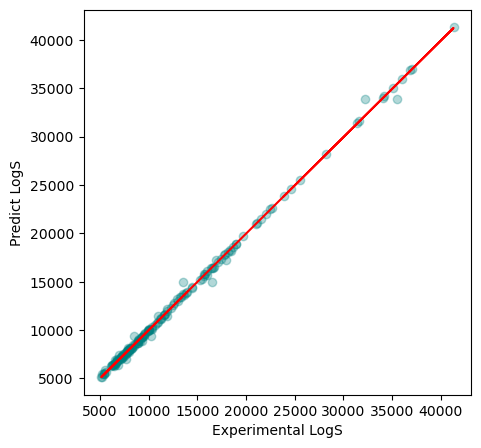

In [39]:
plt.figure(figsize=(5,5))
plt.scatter(x=y_train, y=rf_preds_train, c="#008080" ,alpha=0.3)

z = np.polyfit(y_train, rf_preds_train, 1)
p = np.poly1d(z)

plt.plot(y_train, p(y_train), '#FF0000')
plt.ylabel('Predict LogS')
plt.xlabel('Experimental LogS')